# Imports

In [1]:
!pip install -r requirements.txt

In [2]:
import warnings
warnings.filterwarnings("ignore")
try:
    import spacy
    nlp_model = spacy.load("en_core_web_lg")
    print('spacy model already downloaded')
except:
    !python -m spacy download en_core_web_lg
    import spacy
    nlp_model = spacy.load("en_core_web_lg")

from ipywidgets import interact, interactive, fixed, interact_manual, Layout, FloatSlider, IntSlider
import ipywidgets as widgets
import pandas as pd
import numpy as np
import os
import json
import joblib

import plotly.express as px
import plotly.graph_objects as go
from tqdm import tqdm
import collections
from collections import Counter
import itertools
from dotenv import load_dotenv
import ast
from datetime import datetime

import spotipy
import spotipy.util as util

import keras
import sklearn

spacy model already downloaded


2025-02-25 13:24:54.818899: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-25 13:24:55.016639: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-25 13:24:55.093461: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-25 13:24:55.111230: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-25 13:24:55.234711: I tensorflow/core/platform/cpu_feature_guar

# Environmental Variables

In [3]:
# Load environmental variables
load_dotenv(override=True)
DATA_DIR = os.environ.get('DATA_DIR')
def man_win_lin_encode(str_path):
    if ':' in str_path:
        out = str_path.replace('\\', '/')
        out = out.replace(f'{DATA_DIR[:2]}', f'/mnt/{DATA_DIR[0]}'.lower())
    else:
        out = str_path
    return out
DATA_DIR = man_win_lin_encode(DATA_DIR)
API_KEYS = ast.literal_eval(os.environ.get('APIS'))
SCOPE = os.environ.get('API_SCOPE')
REDIRECT_URI = os.environ.get('REDIRECT_URI')
API_NAMES = list(API_KEYS.keys())
INPUT_PLAYLISTS = ast.literal_eval(os.environ.get('INPUT_PLAYLISTS'))
BLACKLIST_PLAYLISTS = ast.literal_eval(os.environ.get('BLACKLIST_PLAYLISTS'))
OUTPUT_PLAYLISTS = ast.literal_eval(os.environ.get('OUTPUT_PLAYLISTS'))
SAVE_DIR=os.path.join(DATA_DIR, 'Databases', 'Recommend_Data')
if os.path.exists(SAVE_DIR)==False: os.mkdir(SAVE_DIR)
BASIC_DATASET_API_COUNTER = 0
AUDIO_FEATURES_API_COUNTER = 0
REC_SONG_API_COUNTER = 0

# Functions

In [4]:
# Widgets
config = json.load(open('config.json'))
genre_opts = ["acoustic", "afrobeat",'alt-rock', 'alternative', 'ambient',
              'anime', 'black-metal', 'bluegrass', 'blues', 'bossanova',
              'brazil', 'breakbeat', 'british', 'cantopop', 'chicago-house',
              'children', 'chill', 'classical', 'club', 'comedy', 'country',
              'dance', 'dancehall', 'death-metal', 'deep-house','detroit-techno',
              'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
              'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
              'garage','german', 'gospel', 'goth', 'grindcore', 'groove',
              'grunge', 'guitar', 'happy','hard-rock', 'hardcore', 'hardstyle',
              'heavy-metal', 'hip-hop', 'holidays','honky-tonk', 'house', 'idm',
              'indian', 'indie', 'indie-pop', 'industrial','iranian', 'j-dance',
              'j-idol', 'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids','latin',
              'latino', 'malay', 'mandopop', 'metal', 'metal-misc', 'metalcore',
              'minimal-techno', 'movies', 'mpb', 'new-age', 'new-release',
              'opera', 'pagode','party', 'philippines-opm', 'piano', 'pop',
              'pop-film', 'post-dubstep','power-pop', 'progressive-house',
              'psych-rock', 'punk', 'punk-rock', 'r-n-b','rainy-day', 'reggae',
              'reggaeton', 'road-trip', 'rock', 'rock-n-roll','rockabilly',
              'romance', 'sad', 'salsa', 'samba', 'sertanejo', 'show-tunes',
              'singer-songwriter', 'ska', 'sleep', 'songwriter', 'soul',
              'soundtracks','spanish', 'study', 'summer', 'swedish',
              'synth-pop', 'tango', 'techno','trance', 'trip-hop',
              'turkish', 'work-out', 'world-music']
style = {'description_width': '50%'}
new_model_process_wdg = widgets.Checkbox(
    value=False,
    description="Old Data New Model: Prepare old rec data for new model rating",
    disabled=False,
    indent= False,
    layout=Layout(width='50%'),
    style={'description_width': 'initial'}
)

api_wdg = widgets.Dropdown(
    options=API_NAMES,
    value=API_NAMES[1],
    description='API Key',
    layout=Layout(width='25%'),
    disabled=False,
    style={'description_width': 'initial'}
)
api_num_wdg = widgets.Dropdown(
    options=range(1, len(API_NAMES)+1),
    value=10,
    description='Num Apis',
    layout=Layout(width='25%'),
    disabled=False,
    style={'description_width': 'initial'}
)
run_mode_wdg = widgets.Dropdown(
    options=["Initial Recommend Data Prep", "Get Rec Song Ids", "Process Recommendations", "Populate Playlist"],
    value='Populate Playlist',
    description='Operation:',
    layout=Layout(width='25%'),
    disabled=False,
    style={'description_width': 'initial'}
)
use_genre_specific_recs_wdg = widgets.Checkbox(
    value=False,
    description='Use Genres: True- Generate recommendations from genre list, False - recommend based on datasets',
    disabled=False,
    indent= False,
    layout=Layout(width='50%'),
    style={'description_width': 'initial'}
)
sel_genre_1_wdg = widgets.Dropdown(
    options=genre_opts,
    value=None,
    description='Sel_genre_1: Pick a genre if Use Genres is True',
    layout=Layout(width='40%'),
    disabled=False,
    style={'description_width': 'initial'}
)
sel_genre_2_wdg = widgets.Dropdown(
    options=genre_opts,
    value=None,
    description='Sel_genre_2: Pick a genre if Use Genres is True',
    layout=Layout(width='40%'),
    disabled=False,
    style={'description_width': 'initial'}
)
sel_genre_3_wdg = widgets.Dropdown(
    options=genre_opts,
    value=None,
    description='Sel_genre_3: Pick a genre if Use Genres is True',
    layout=Layout(width='40%'),
    disabled=False,
    style={'description_width': 'initial'}
)
playlist_update_mode_wdg = widgets.Dropdown(
    options=["threshold", "percentile", "number"],
    value="number",
    description='Playlist Update Method: ',
    layout=Layout(width='50%'),
    disabled=False,
    style={'description_width': 'initial'}
)
threshold_sel_wdg = widgets.FloatSlider(
    value=3.5,
    min=0,
    max=10.0,
    step=0.1,
    description='Threshold:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    layout=Layout(width='50%'),
    readout=True,
    readout_format='.1f',
)
percentile_sel_wdg = widgets.IntSlider(
    value=90,
    min=0,
    max=100,
    step=1,
    description='Percentile:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    layout=Layout(width='50%'),
    readout=True,
    readout_format='d'
)
number_sel_wdg = widgets.IntSlider(
    value=500,
    min=0,
    max=500,
    step=50,
    description='Number:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    layout=Layout(width='50%'),
    readout=True,
    readout_format='d'
)
flt_listened_songs_wdg = widgets.Checkbox(
    value=True,
    description="Filter Listened Songs: True - Don't add songs you've listened to",
    disabled=False,
    indent= False,
    layout=Layout(width='50%'),
    style={'description_width': 'initial'}
)
any_genre_output_wdg = widgets.Checkbox(
    value=False,
    description="Filter output song genre: Filter output songs by Output Song Genre",
    disabled=False,
    indent= False,
    layout=Layout(width='50%'),
    style={'description_width': 'initial'}
)
output_genre_wdg = widgets.Dropdown(
    options=genre_opts,
    value=None,
    description='Output Song Genre: Select genre for songs to be outputted',
    layout=Layout(width='40%'),
    disabled=False,
    style={'description_width': 'initial'}
)
replace_playlist_songs_wdg = widgets.Checkbox(
    value=True,
    description="Replace Songs: Replace songs in output playlist",
    disabled=False,
    indent= False,
    layout=Layout(width='50%'),
    style={'description_width': 'initial'}
)
output_playlist_wdg = widgets.Dropdown(
    options=list(OUTPUT_PLAYLISTS.keys()),
    value=list(OUTPUT_PLAYLISTS.keys())[0],
    description='Output Playlist',
    layout=Layout(width='40%'),
    disabled=False,
    style={'description_width': 'initial'}
)
filter_songs_from_reg_database_wdg = widgets.Checkbox(
    value=True,
    description="Filter from regular database for Genre: use songs from regular database for genre recommendations",
    disabled=False,
    indent= False,
    layout=Layout(width='50%'),
    style={'description_width': 'initial'}
)
playlist_seeds_wdg = widgets.SelectMultiple(
    options=list(config['ratings'][config['prediction_type']].keys()),
    value=['Liked_Songs', 'Favorite_Songs'],
    #rows=10,
    description='Playlists to use for recommendation seeds (Ctrl for multiple selections)',
    disabled=False,
    style = {'description_width': 'initial'},
    layout=Layout(width='40%')
)


def reformat_rated_songs():
        status=True
        for file in ['all_song_ids.csv', 'song_recs.csv', 'song_recs_rated.csv', 'viewed_songs.csv']:
            rated_song_path = os.path.join(SAVE_DIR, file)
            if os.path.exists(rated_song_path) == False:
                status=False
        if status==False:
            print('(Old Data New Model) was selected but the pre-requisite files were not found.  Uncheck this option and rerun initial recommendation data prep')
        else:
            # load song_recs_rated
            df_recs = pd.read_csv(os.path.join(SAVE_DIR, 'song_recs.csv'))
            # load rated songs
            rated_song_path = os.path.join(SAVE_DIR, 'song_recs_rated.csv')
            df_old_rated_results = pd.read_csv(rated_song_path).set_index('song_id')
            # Load Viewed Songs
            viewed_song_path = os.path.join(SAVE_DIR, 'viewed_songs.csv')
            old_viewed_songs = pd.read_csv(viewed_song_path)['song_id'].tolist()
            # Load Listened Songs if available
            save_dir = os.path.join(SAVE_DIR, 'song_listened.csv')
            if os.path.exists(save_dir):
                df_old_listened = pd.read_csv(save_dir)
                df_old_listened.rename(columns={'Unnamed: 0': 'song_id'}, inplace=True)
                df_old_listened.set_index('song_id', inplace=True)
                
            # Move rated song ids that were not listened to, to song_recs and save both
            df_old_rated_results_flt = df_old_rated_results[~df_old_rated_results.index.isin(df_old_listened.index)]
            df_new_recs = pd.DataFrame(df_old_rated_results_flt.index.tolist() + df_recs['song_id'].tolist(), columns=['song_id']).dropna()
            df_new_rated = pd.DataFrame(columns=['overall_model'])
            df_new_rated.index.name='song_id'
            df_new_rated.to_csv(rated_song_path)
            df_new_recs.to_csv(os.path.join(SAVE_DIR, 'song_recs.csv'))
            print('Successfully Updated')


def process_songs(api_num, sp, num_songs=1700):
        global AUDIO_FEATURES_API_COUNTER
        print(f'Starting Run #{api_num+1}')
        sp = check_api_swap(sp)
        # Load song Ids
        df_recs = pd.read_csv(os.path.join(SAVE_DIR, 'song_recs.csv'))
        rec_songs = np.asarray(df_recs['song_id'].tolist())
        rec_songs = rec_songs[rec_songs[:]!='nan']
        if len(rec_songs)>1700:
          rec_songs_sel = list(set(np.random.choice(rec_songs, num_songs, replace=False)))
        else:
          rec_songs_sel = list(set(rec_songs))
        rec_songs_sel = pd.DataFrame(rec_songs_sel, columns=['song_id'])
        # Wrangle Data - get basic song data
        df = create_song_df(rec_songs_sel)
        df_basic= wrangle(df)

        # Get audio analysis data
        df_raw_td_data, sp = audio_analysis(df_basic.index.tolist(), sp=sp)

        # Run sub models on split data
        df_result = get_song_scores(df_basic, df_raw_td_data, model_dict)

        # Adjust rec songs and remove rated songs
        new_rec = set(df_recs['song_id'].tolist()) - set(rec_songs_sel['song_id'].tolist())
        df_new_rec = pd.DataFrame(new_rec, columns=['song_id'])
        df_new_rec.to_csv(os.path.join(SAVE_DIR, 'song_recs.csv'))
        # adjusted rated songs by adding rated songs
        rated_song_path = os.path.join(SAVE_DIR, 'song_recs_rated.csv')
        if os.path.exists(rated_song_path) == False:
            df_result=df_result.sort_values('overall_model', ascending=False)
            df_result.to_csv(rated_song_path)
            table_display=df_result
        else:
            df_old_results = pd.read_csv(rated_song_path).set_index('song_id')
            df_new_results = pd.concat([df_old_results, df_result])
            df_new_results = df_new_results.reset_index().drop_duplicates(subset='song_id').sort_values('overall_model', ascending=False).set_index('song_id')
            df_new_results.to_csv(rated_song_path)
            table_display=df_new_results
        # adjust viewed songs
        viewed_song_path = os.path.join(SAVE_DIR, 'viewed_songs.csv')
        if os.path.exists(viewed_song_path) == False:
            rec_songs_sel.to_csv(viewed_song_path)
        else:
            old_viewed_songs = pd.read_csv(viewed_song_path)['song_id'].tolist()
            viewed_songs = list(set(old_viewed_songs + rec_songs_sel['song_id'].tolist()))
            df_viewed_songs = pd.DataFrame(viewed_songs, columns=['song_id'])
            df_viewed_songs.to_csv(viewed_song_path)
        # share results
        print(f'# of Rated Songs: {table_display.shape[0]}')
        print(f'# of Songs Left to be Rated: {df_new_rec.shape[0]}')
        # reset api
        AUDIO_FEATURES_API_COUNTER = 1700
        print(f'Finished Run #{api_num+1}')
        return sp



def get_song_scores(df_basic, df_raw_td_data, model_dict):
    null_tracker={}
    config = json.load(open('config.json'))
    for i in range(df_raw_td_data.shape[0]):
        null_tracker[f'{i+1}'] = []
    features = ["genre", "general", "sct_data", "sgm_loud", "sgm_pitch", "sgm_timbre"]
    for feature in features:
        null_tracker, feature_data = generate_feature_norms(df_basic, df_raw_td_data, feature=feature,
                                                   null_tracker=null_tracker, output_data=False)
    for feature in features:
        _, feature_data = generate_feature_norms(df_basic, df_raw_td_data, feature=feature,
                                                     null_tracker=null_tracker, output_data=True)
        # run predictions on feature data
        if feature=='genre' or feature=='general':
            preds = model_dict[feature].predict(feature_data, verbose=0)
        else:
            data = np.float32(np.array([np.array(row) for row in feature_data[feature].values]))
            preds = model_dict[feature].predict(data, verbose=0)
        feature_data[feature] = preds
        # normalize output
        feature_data[feature] = minmax(feature_data[feature], config['norms']['overall'][f'{feature}_min'],
                                         config['norms']['overall'][f'{feature}_max'])
        df = feature_data[[feature]]
        if feature=='genre':
            df_pred = df
        else:
            df_pred = pd.merge(df_pred, df, how='inner',
                              left_on=['song_id'],
                              right_on=['song_id'])
    # predict overall features
    lr_model = model_dict['overall']
    preds = lr_model.predict(df_pred[["genre", "general", "sct_data", "sgm_loud", "sgm_pitch", "sgm_timbre"]])
    df_pred['overall_model'] = preds
    df_result = df_pred[['overall_model']]
    return df_result


def get_song_scores_big_data(df_basic, df_raw_td_data, model_dict):
    config = json.load(open('config.json'))
    null_tracker={}
    config = json.load(open('config.json'))
    for i in range(df_raw_td_data.shape[0]):
        null_tracker[f'{i+1}'] = []
    features = [["genre"], ["general"], ["sct_data", "sgm_loud", "sgm_pitch", "sgm_timbre"]]
    # Find tracks with nulls
    for feature in features:
          for sub_feature in feature:
              null_tracker, feature_data = generate_feature_norms(df_basic, df_raw_td_data, feature=sub_feature,
                                                null_tracker=null_tracker, output_data=False)
    # Remove tracks with nulls
    for feature in features:
        for sub_feature in feature:
            _, feature_data = generate_feature_norms(df_basic, df_raw_td_data, feature=sub_feature,
                                                     null_tracker=null_tracker, output_data=True)
            if sub_feature in ('genre', 'general'):
                x = feature_data.values
                norm_feat_name=sub_feature
            else:
                x = np.array(feature_data[sub_feature].tolist())
                norm_feat_name=='big_data'
            song_id = np.array(feature_data.index)
            if sub_feature not in ('genre', 'general'):
              if sub_feature=='sct_data':
                x = np.repeat(x, 10, axis=1)
              df = pd.DataFrame(data=list(zip(song_id, x)),
                       columns=['song_id', sub_feature])
              if sub_feature=='sct_data':
                  df_pred = df
              else:
                  df_pred = pd.merge(df_pred, df, how='inner',
                                    left_on=['song_id'],
                                    right_on=['song_id'])
        if feature not in (['genre'], ['general']):
            ## big feature setup
            feature_name='big_data'
            x_sct_data = np.float32(np.array([np.array(row) for row in df_pred['sct_data']]))
            x_sgm_loud = np.float32(np.array([np.array(row) for row in df_pred['sgm_loud']]))
            x_sgm_pitch = np.float32(np.array([np.array(row) for row in df_pred['sgm_pitch']]))
            x_sgm_timbre = np.float32(np.array([np.array(row) for row in df_pred['sgm_timbre']]))
            x = np.array(np.dstack((np.dstack((np.dstack((x_sct_data, x_sgm_loud)), x_sgm_pitch[:,:,1:])), x_sgm_timbre[:,:,1:])))
            song_id = df_pred['song_id'].to_numpy()
        else:
            feature_name=feature[0]
        # make prediction
        preds = model_dict[feature_name].predict(x, verbose=0)
        preds = minmax(preds, config['norms']['overall'][f'{norm_feat_name}_min'],
                                         config['norms']['overall'][f'{norm_feat_name}_max'])
        df = pd.DataFrame(data=list(zip(song_id, preds.reshape(-1,))),
           columns=['song_id', feature_name])
        if feature_name=='genre':
          df_final = df
        else:
          df_final = pd.merge(df_final, df, how='inner',
                            left_on=['song_id'],
                            right_on=['song_id'])
    lr_model = model_dict['overall']
    df_final.set_index('song_id', inplace=True)
    df_final[df_final < 0] = 0
    df_final[df_final >1] = 1
    preds = lr_model.predict(df_final[['genre', 'general', 'big_data']])
    df_final['overall_model'] = preds
    df_result = df_final[['overall_model']]
    return df_result


def create_song_df(data):
  global BASIC_DATASET_API_COUNTER
  raw_song_data = []
  if data.shape[0] >50:
      song_chunks = list(chunks(data['song_id'].tolist(), 50))
      for sample in song_chunks:
        results = sp.tracks(sample)['tracks']
        data_len = len(results)
        BASIC_DATASET_API_COUNTER += data_len
        raw_song_data.extend(results)
  else:
    results = sp.tracks(data['song_id'].tolist())['tracks']
    data_len = len(results)
    BASIC_DATASET_API_COUNTER += data_len
    raw_song_data.extend(results)
  # extract key song details from raw_song_data
  song_info = extract_song_contents(raw_song_data)
  return song_info



def process_str_list(sample):
  '''Converst string list to list'''
  sample = sample.replace("\n", "").replace("[", "").replace("]", "")
  sample_list = list(sample.split(" "))
  sample_list=[x for x in sample_list if len(x)>0]
  sample_list = [float(x.replace(',','')) for x in sample_list]
  return sample_list


def minmax(data, min, max):
  return ( (data - min) / (max - min) )


def create_td_data(feature_list, time_segments, feature_idxs, mins=None, maxs=None,
                   means=None, sdvs=None, modify_idxs=None, add_val=None,
                   divide_val=None, divide_list=None,
                   normalization_mode='minmax', run_normalization=True):
  '''Creates a time series transformation of the data'''
  songs = []
  # Loop through song
  for song in feature_list:
    song_data = []
    counter=0
    # Loop through columns to input for feature data
    for threshold in time_segments:
      # Loop through feature values and stop once you find a match
      features = []
      for feature in song[counter:]:
        start, end = feature[0], feature[3]
        # Check if features apply to this time period
        if (threshold > start) & (threshold <= end):
          components=[]
          # loop through components and get z-score or minmax
          if normalization_mode=='minmax':
            for i, idx, min, max in zip(range(len(feature_idxs)), feature_idxs, mins, maxs):
              if idx in modify_idxs:
                # print(i)
                if divide_list:
                  value = (feature[idx] + add_val) / divide_list[i-1]
                  value = minmax(value, min, max)
                else:
                  if (add_val != None) & (divide_val != None):
                    value = (feature[idx] + add_val) / divide_val
                    if run_normalization:
                      value = minmax(value, min, max)
                  else:
                    if add_val != None:
                      value = minmax(add_val + feature[idx], min, max)
                    else:
                      value = minmax(feature[idx], min, max)
              else:
                value = minmax(feature[idx], min, max)
              components.append(value)
          # add values
          # if len(components) != 13: print(len(feature_idxs), len(means), len(sddevs))
          features.extend(components)
          break

        # seconds is past feature
        elif threshold > start:
          counter+=1
      # no matches add 0
      if len(features)==0:
        features.extend([0] * (len(feature_idxs)))
      song_data.append(features)

    # Add song features
    songs.append(song_data)

  return songs



def generate_feature_norms(df_basic, df_td_data, feature, output_data=True, null_tracker=None):
  '''Create feature table for feature from raw time domain dataset and basic dataset'''
  # loop through basic and raw td files and extract feature contents
  # df_basic.genres = df_basic.genres.apply(process_str_list)
  run_normalization=output_data
  if feature!='genre':
    if feature == 'sct_data':
      load_cols = ['sct_loud', 'sct_tempo', 'sct_key', 'sct_mode', 'sct_time_sig']
    elif feature == 'general':
      load_cols = ['song_dur', 'tempo', 'tempo_confidence', 'time_sig',
                   'time_sig_confidence', 'key', 'key_confidence',
                   'mode', 'mode_confidence', 'fade_in_dur', 'fade_out_dur',
                   'num_bars', 'num_beats', 'num_sections', 'num_segments', 'num_tatums',
                   'bar_dur_avg', 'beat_dur_avg', 'tatum_dur_avg',
                   'bar_dur_sdv', 'beat_dur_sdv', 'tatum_dur_sdv',
                   'bar_conf_avg', 'beat_conf_avg', 'tatum_conf_avg',
                   'bar_conf_sdv', 'beat_conf_sdv', 'tatum_conf_sdv',
                   'section_dur_avg', 'section_dur_sdv', 'section_conf_avg', 'section_conf_sdv',
                   'segment_dur_avg', 'segment_dur_sdv', 'segment_conf_avg', 'segment_conf_sdv']
    else:
      load_cols= [feature]
    df_td_data = df_td_data[load_cols]
    df_td_data.index.name='song_id'

  # remove rows with row in any of the dataframes by checking null tracker
  try:
    null_idxs = null_tracker[f'{i+1}']
  except:
    null_idxs = null_tracker[i+1]
  if feature=='genre':
    drop_ids=[]
    data_list = list(df_basic['genres'])
    df_output = pd.DataFrame(data_list)
    # Convert to dataframe and add index back in
    df_output = pd.DataFrame(df_output)
    test = df_output.to_numpy()
    for j, row in enumerate(test):
      for k, col in enumerate(row):
        if type(col)!=np.float32 or np.isnan(col):
          drop_ids = list(set(drop_ids + [j]))
          print(col, type(col))
          null_tracker[f'{i+1}'] = list(set(null_tracker[f'{i+1}'] + [j]))
    df_output.index = df_basic.index
    df_output = df_output.drop(df_output.index[drop_ids])
  elif (feature=='sgm_pitch') or (feature=='sgm_timbre'):
    feature_list = df_td_data[feature].tolist()
    out_new = []
    for song in feature_list:
      song_data = []
      for j in range(0, len(song),5):
        segment_data = [song[j], song[j+1], song[j+2], song[j+3]]
        segment_data.extend([item for item in song[j+4]])
        song_data.append(segment_data)
      out_new.append(song_data)
    df_td_data[feature] = out_new
    df_output = df_td_data
  elif feature=='general':
    drop_ids=[]
    # Combine dataframes
    df_output = pd.merge(df_basic, df_td_data, how='right',
                                  left_on=['song_id'],
                                  right_on=['song_id'], suffixes=('_x', ''))
    df_output = df_output.drop(columns=['genres', 'mode_x', 'time_sig_x', 'key_x', 'tempo_x'])
    # Check for nulls
    test = df_output.to_numpy()
    if run_normalization== False:
        for j, row in enumerate(test):
          for k, col in enumerate(row):
            if type(col)!=np.float64 or np.isnan(col):
              drop_ids = list(set(drop_ids + [j]))
              null_tracker[f'{i+1}'] = list(set(null_tracker[f'{i+1}'] + [j]))
        df_output = df_output.drop(df_output.index[drop_ids])
  elif feature=='sct_data':
    # convert list in string to list
    try:
      for col in df_td_data.columns:
        if type(df_td_data[col][0])==str:
          df_td_data[col] = df_td_data[col].apply(ast.literal_eval)
    except:
      # nulls detected, grab ids and drop rows
      null_idxs = df_td_data.reset_index()[df_td_data.reset_index().isnull().any(axis=1)].index.tolist()
      null_tracker[f'{i+1}'] = list(set(null_tracker[f'{i+1}'].extend(null_idxs)))
      if run_normalization == False:
          df_td_data.drop(df_td_data.index[null_idxs], inplace=True)
          df_basic.drop(df_basic.index[null_idxs], inplace=True)
          for col in df_td_data.columns:
            if type(df_td_data[col][0])==str:
              df_td_data[col] = df_td_data[col].apply(ast.literal_eval)
    df_output = df_td_data
  else:
    df_output = df_td_data

  config = json.load(open('config.json'))

  # apply normalization
  # Drop null rows
  if run_normalization:
      if len(null_idxs) > 0:
          df_basic = df_basic.drop(df_basic.index[null_idxs])
          if feature!='genre':
              df_td_data = df_td_data.drop(df_td_data.index[null_idxs])
          if feature=='general':
              df_output.drop(df_output.index[null_idxs], inplace=True)
      if feature != 'sgm_pitch':
        min_max_dict = config['norms'][feature]
      if feature=='sct_data':
        for col in df_output.columns:
          if type(df_td_data[col][0])==str:
            df_output[col] = df_output[col].apply(ast.literal_eval)
          ## sct_loud
        sub_feature='sct_loud'
        mins = [min_max_dict['sct_conf_min'], min_max_dict[f'{sub_feature}_min']]
        maxs = [min_max_dict['sct_conf_max'], min_max_dict[f'{sub_feature}_max']]
        out_loud = np.array(create_td_data(feature_list=list(df_output[sub_feature]),
                                           time_segments=list(range(1,301)), feature_idxs=[2,4],
                                           mins=mins, maxs=maxs, modify_idxs=[4], add_val=100))
        ## sct_tempo
        sub_feature='sct_tempo'
        mins = [min_max_dict['sct_conf_min'], min_max_dict[f'{sub_feature}_min'], min_max_dict[f'{sub_feature}_conf_min']]
        maxs = [min_max_dict['sct_conf_max'], min_max_dict[f'{sub_feature}_max'], min_max_dict[f'{sub_feature}_conf_max']]
        out_tempo = np.array(create_td_data(feature_list=list(df_output[sub_feature]), time_segments=list(range(1,301)),
                                            feature_idxs=[2, 4, 5], mins=mins, maxs=maxs,
                                            modify_idxs=[4]))
        # sct_key
        sub_feature='sct_key'
        mins = [min_max_dict['sct_conf_min'], min_max_dict[f'{sub_feature}_min'], min_max_dict[f'{sub_feature}_conf_min']]
        maxs = [min_max_dict['sct_conf_max'], min_max_dict[f'{sub_feature}_max'], min_max_dict[f'{sub_feature}_conf_max']]
        out_key = np.array(create_td_data(feature_list=list(df_output[sub_feature]), time_segments=list(range(1,301)),
                                          feature_idxs=[2, 4, 5], mins=mins, maxs=maxs,
                                          modify_idxs=[4], add_val=1, divide_val=12))
        # sct_mode
        sub_feature='sct_mode'
        mins = [min_max_dict['sct_conf_min'], min_max_dict[f'{sub_feature}_min'], min_max_dict[f'{sub_feature}_conf_min']]
        maxs = [min_max_dict['sct_conf_max'], min_max_dict[f'{sub_feature}_max'], min_max_dict[f'{sub_feature}_conf_max']]
        out_mode = np.array(create_td_data(feature_list=list(df_output[sub_feature]), time_segments=list(range(1,301)),
                                          feature_idxs=[2, 4, 5], mins=mins, maxs=maxs,
                                          modify_idxs=[4], add_val=0, divide_val=1))
        # sct_time_sig
        sub_feature='sct_time_sig'
        mins = [min_max_dict['sct_conf_min'], min_max_dict[f'{sub_feature}_min'], min_max_dict[f'{sub_feature}_conf_min']]
        maxs = [min_max_dict['sct_conf_max'], min_max_dict[f'{sub_feature}_max'], min_max_dict[f'{sub_feature}_conf_max']]
        out_time_sig = np.array(create_td_data(feature_list=list(df_output[sub_feature]), time_segments=list(range(1,301)),
                                          feature_idxs=[2, 4, 5], mins=mins, maxs=maxs,
                                          modify_idxs=[4], add_val=0, divide_val=7))
        # Concat section features
        song_id_output = df_output.index
        df_output = np.concatenate([out_loud, out_tempo[:, :, 1:], out_key[:, :, 1:], out_mode[:, :, 1:], out_time_sig[:, :, 1:]], -1)
        df_output = pd.DataFrame(data=zip(df_output.tolist()), columns=['sct_data'])
        df_output.index = song_id_output
      elif feature=='sgm_loud':
        mins = [min_max_dict[f'sgm_conf_min'], min_max_dict['sgm_loud_start_min'], min_max_dict['sgm_loud_max_min'],
                min_max_dict['sgm_loud_max_time_min'], min_max_dict['sgm_loud_end_min']]
        maxs = [min_max_dict[f'sgm_conf_max'], min_max_dict['sgm_loud_start_max'], min_max_dict['sgm_loud_max_max'],
                  min_max_dict['sgm_loud_max_time_max'], min_max_dict['sgm_loud_end_max']]
        out_sgm_loud = np.array(create_td_data(feature_list=list(df_output[feature]),
                                               time_segments=list(np.arange(0.1,300.1, 0.1)),
                                               feature_idxs=[2, 4, 5, 6, 7], mins=mins, maxs=maxs,
                                               modify_idxs=[4, 5, 7], add_val=100, divide_val=1))
        song_id_output = df_output.index
        df_output = pd.DataFrame(data=zip(out_sgm_loud.tolist()), columns=[feature])
        df_output.index = song_id_output
      elif feature=='sgm_timbre':
        mins = [config['norms']['sgm_loud']['sgm_conf_min']] + [min_max_dict[f'sgm_timbre_{k}_min'] for k in range(1,13)]
        maxs = [config['norms']['sgm_loud']['sgm_conf_max']] + [min_max_dict[f'sgm_timbre_{k}_max'] for k in range(1,13)]
        out_sgm_timbre = np.array(create_td_data(feature_list=list(df_output[feature]),
                                                 time_segments=list(np.arange(0.1,300.1, 0.1)),
                                                 feature_idxs=[2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
                                                 mins=mins, maxs=maxs,
                                                 modify_idxs=[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
                                                 add_val=1000))
        song_id_output = df_output.index
        df_output = pd.DataFrame(data=zip(out_sgm_timbre.tolist()), columns=[feature])
        df_output.index = song_id_output
      elif feature=='sgm_pitch':
        mins = [config['norms']['sgm_loud']['sgm_conf_min']] + [0 for k in range(1,13)]
        maxs = [config['norms']['sgm_loud']['sgm_conf_max']] + [1 for k in range(1,13)]
        out_sgm_pitch = np.array(create_td_data(feature_list=list(df_output[feature]),
                                                time_segments=list(np.arange(0.1,300.1, 0.1)),
                                                feature_idxs=[2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
                                                mins=mins, maxs=maxs,
                                                modify_idxs=[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
                                                add_val=0.000001, divide_val=1))
        song_id_output = df_output.index
        df_output = pd.DataFrame(data=zip(out_sgm_pitch.tolist()), columns=[feature])
        df_output.index = song_id_output
      elif feature=='genre':
        for col in range(300):
          df_output[col] = minmax(df_output[col], min_max_dict[f'{col}_min'], min_max_dict[f'{col}_max'])
          df_output.loc[df_output[col] > 1, col] = 1
          df_output.loc[df_output[col] < 0, col] = 0
      elif feature=='general':
        # repeat column
        if df_output.shape[0]!=df_td_data.shape[0]:
            print('norm data')
            print(f'Different basic and td data shapes for feature {feature} and index {i+1}')
            print(df_basic.shape, df_td_data.shape, df_output.shape)
            return df_basic, df_td_data, df_output
        try:
          df_output = df_output.drop(columns=['dur'])
        except:
          pass
        cols = list(df_output.columns)
        for bad_id in ['explicit', 'album_type', 'mode', 'time_sig',
                       'mode_confidence', 'key_confidence', 'time_sig_confidence',
                       'tempo_confidence']:
          try:
            cols.remove(bad_id)
          except:
            print('fail removing non-norm, general columns')
            print(bad_id, cols)
            pass
        for col in cols:
          df_output[col] = minmax(df_output[col], min_max_dict[f'{col}_min'], min_max_dict[f'{col}_max'])
          df_output.loc[df_output[col] > 1, col] = 1
          df_output.loc[df_output[col] < 0, col] = 0
        # df_output.reset_index(inplace=True)

  return null_tracker, df_output


def audio_analysis(song_list, sp=None):
  '''Obtains audio analysis data'''
  global AUDIO_FEATURES_API_COUNTER

  total_songs = len(song_list)
  out, song_ids = [], []
  counter=0
  sp = create_connection(hide_output=True)
  for song in tqdm(song_list):
    if counter >= 1000:
      try:
        sp = create_connection()
        counter = 0
      except:
        print('Failed to reset authorization to spotify')
        break
    else:
      counter += 1
    # Obtain Data
    try:
      out.append(sp.audio_analysis(song))
      song_ids.append(song)
      AUDIO_FEATURES_API_COUNTER += 1
      # sp = check_api_swap(sp)
    except:
      pass

  # Create empty lists
  categories = ["song_dur", "tempo", "tempo_confidence", "time_sig", "time_sig_confidence",
    "key", "key_confidence", "mode", "mode_confidence", "fade_in_dur", "fade_out_dur",
    "num_bars", "num_beats", "num_sections", "num_segments", "num_tatums",
    "bar_data", "beat_data", "tatum_data", 'sct_loud', 'sct_tempo', 'sct_key', 'sct_mode', 'sct_time_sig',
    'sgm_loud', 'sgm_pitch', 'sgm_timbre',]

  song_dur, tempo, tempo_confidence, time_sig, time_sig_confidence = [], [], [], [], []
  key, key_confidence, mode, mode_confidence, fade_in_dur, fade_out_dur = [], [], [], [], [], []
  num_bars, num_beats, num_sections, num_segments, num_tatums = [], [], [], [], []
  bar_data, beat_data, tatum_data = [], [], []
  # Section Data
  sct_loud, sct_tempo, sct_key, sct_mode, sct_time_sig = [], [], [], [], []
  # Segment Data
  sgm_loud, sgm_pitch, sgm_timbre = [], [], []
  extra_song_ids = []

  for song, song_id in zip(out, song_ids):
    try:
      extra_song_ids.append(song_id)
      # Song Traits
      duration = song['track']['duration']
      song_dur.append(song['track']['duration'])
      tempo.append(song['track']['tempo'])
      tempo_confidence.append(song['track']['tempo_confidence'])
      time_sig.append(song['track']['time_signature'] / 7)
      time_sig_confidence.append(song['track']['time_signature_confidence'])
      key.append(song['track']['key'])
      key_confidence.append(song['track']['key_confidence'])
      mode.append(song['track']['mode'])
      mode_confidence.append(song['track']['mode_confidence'])
      fade_in_dur.append(song['track']['end_of_fade_in'])
      fade_out_dur.append(duration - song['track']['start_of_fade_out'])
      num_bars.append(len(song['bars']))
      num_beats.append(len(song['beats']))
      num_sections.append(len(song['sections']))
      num_segments.append(len(song['segments']))
      num_tatums.append(len(song['tatums']))

      # Obtain bar Data
      song_bar_data = []
      for bar in song['bars']:
        temp_data = [bar['start'], bar['duration'], bar['confidence']]
        song_bar_data.append(temp_data)
      bar_data.append(song_bar_data)

      # Obtain beat data
      song_beat_data = []
      for beat in song['beats']:
        temp_data = [beat['start'], beat['duration'], beat['confidence']]
        song_beat_data.append(temp_data)
      beat_data.append(song_beat_data)

      # Section Data
      song_sct_loud, song_sct_tempo, song_sct_key, song_sct_mode, song_sct_time_sig = [], [], [], [], []
      for section in song['sections']:
        # Loudness
        temp_data = [section['start'], section['duration'], section['confidence'], section['start'] + section['duration'],  section['loudness']]
        song_sct_loud.append(temp_data)
        # Tempo
        temp_data = [section['start'], section['duration'], section['confidence'], section['start'] + section['duration'], section['tempo'], section['tempo_confidence']]
        song_sct_tempo.append(temp_data)
        # Key
        temp_data = [section['start'], section['duration'], section['confidence'], section['start'] + section['duration'], section['key'], section['key_confidence']]
        song_sct_key.append(temp_data)
        # Mode
        temp_data = [section['start'], section['duration'], section['confidence'], section['start'] + section['duration'], section['mode'], section['mode_confidence']]
        song_sct_mode.append(temp_data)
        # Time signature
        temp_data = [section['start'], section['duration'], section['confidence'], section['start'] + section['duration'], section['time_signature'], section['time_signature_confidence']]
        song_sct_time_sig.append(temp_data)
      sct_loud.append(song_sct_loud)
      sct_tempo.append(song_sct_tempo)
      sct_key.append(song_sct_key)
      sct_mode.append(song_sct_mode)
      sct_time_sig.append(song_sct_time_sig)

      # Segment data
      song_sgm_loud, song_sgm_pitch, song_sgm_timbre = [], [], []
      for segment in song['segments']:
        # Loudness
        temp_data = [segment['start'], segment['duration'], segment['confidence'], segment['start'] + segment['duration'], segment['loudness_start'], segment['loudness_max'], segment['loudness_max_time'], segment['loudness_end']]
        song_sgm_loud.append(temp_data)
        # Pitch
        temp_data = [segment['start'], segment['duration'], segment['confidence'], segment['start'] + segment['duration'], segment['pitches']]
        song_sgm_pitch.extend(temp_data)
        # Timbre
        temp_data = [segment['start'], segment['duration'], segment['confidence'], segment['start'] + segment['duration'], segment['timbre']]
        song_sgm_timbre.extend(temp_data)

      sgm_loud.append(song_sgm_loud)
      sgm_pitch.append(song_sgm_pitch)
      sgm_timbre.append(song_sgm_timbre)

      # Tatum data
      song_tatum_data = []
      for tatum in song['tatums']:
        temp_data = [tatum['start'], tatum['duration'], tatum['confidence']]
        song_tatum_data.append(temp_data)
      tatum_data.append(song_tatum_data)
    except:
      print(f'no data for song_id: {song_id}, filling with 0')
      variables = [song_dur, tempo, tempo_confidence, time_sig, time_sig_confidence,
                  key, key_confidence, mode, mode_confidence, fade_in_dur, fade_out_dur,
                  num_bars, num_beats, num_sections, num_segments, num_tatums,
                  bar_data, beat_data, tatum_data,
                  sct_loud, sct_tempo, sct_key, sct_mode, sct_time_sig,
                  sgm_loud, sgm_pitch, sgm_timbre]
      for variable in variables:
        variable.append(0)


  # Create DataFrame
  data = list(zip(song_dur, tempo, tempo_confidence, time_sig, time_sig_confidence,
    key, key_confidence, mode, mode_confidence, fade_in_dur, fade_out_dur,
    num_bars, num_beats, num_sections, num_segments, num_tatums,
    bar_data, beat_data, tatum_data,
    sct_loud, sct_tempo, sct_key, sct_mode, sct_time_sig,
    sgm_loud, sgm_pitch, sgm_timbre))
  df = pd.DataFrame(data=data, columns=categories, index=extra_song_ids)
  # Drop rows with bad index
  # df.drop([index for index in list(df.index) if 'fail' in index], inplace=True)
  # Handle Bar, Beat and tatum Data
  # Beat
  for name, item in zip(['section', 'segment', 'bar', 'beat', 'tatum' ], ['sct_loud', 'sgm_loud','bar_data', 'beat_data', 'tatum_data']):
    data = list(df[item].values)
    s_dur_avg, s_dur_sdv, s_conf_avg, s_conf_sdv = [], [], [], []
    for song in data:
      dur, conf = [], []
      for component in song:
        dur.append(component[1])
        conf.append(component[2])
      s_dur_avg.append(np.mean(dur))
      s_dur_sdv.append(np.std(dur))
      s_conf_sdv.append(np.std(conf))
      s_conf_avg.append(np.mean(conf))
    df[f'{name}_dur_avg'] = s_dur_avg
    df[f'{name}_dur_sdv'] = s_dur_sdv
    df[f'{name}_conf_avg'] = s_conf_avg
    df[f'{name}_conf_sdv'] = s_conf_sdv

  # Drop Columns
  df.drop(columns=['bar_data', 'beat_data', 'tatum_data'], inplace=True)

  return df, sp


def man_ord_encode(item):
  '''Manual encode album type column with values between 0 and 1
  Input:
    item (string): album string name
  Output:
    out (float): value based on album string name
    '''
  if item.lower() == 'single':
    out = 0.33
  elif item.lower() == 'album':
    out = 0.66
  elif item.lower() == 'compilation':
    out=0.99
  else:
    out=0
  return out


def normalize_data(data, use_max=None, use_min=None, sav_max=False):
    ''' Normalizes a list of data to be values from 0-1.  Uses a max value if
        provided
    Input:
      data (list): list of data points
      use_max (float): if specified, uses provided max value
      sav_max (bool): if True, save outputs data max.
    Output:-
      norm_data (list): normalized from 0 - 1
      norm_data (float): calculated maximum data point
      '''
    if use_max:
      data_max = use_max
      data_min = use_min
    else:
      data_max = np.max(data)
      data_min = np.min(data)
    norm_data = (data - data_min) / (data_max - data_min)
    if sav_max:
      return norm_data, data_max, data_min
    else:
      return norm_data


def create_connection(hide_output=False):
    '''Creates a spotipy connection.  If fails then delete .cache file and re-try'''
    global CLIENT_ID, CLIENT_SECRET, REDIRECT_URI, SCOPE, SELECTED_API
    try:
      sp = spotipy.Spotify(
          auth_manager=spotipy.SpotifyOAuth(
              client_id=CLIENT_ID,
              client_secret=CLIENT_SECRET,
              redirect_uri=REDIRECT_URI,
              scope=SCOPE, open_browser=False),
              requests_timeout=20, retries=3)
      form_conn = sp.track('7mRzehs3auawQpljt3VeEj')
      # test_audio_analysis = sp.audio_analysis('7mRzehs3auawQpljt3VeEj')
      if hide_output==False:
        print(f'Authorization {SELECTED_API} Sucessfull!')
    except:
      try:
        print('Removing spotipy cache file since api failed the 1st try.')
        os.remove('.cache')
        sp = spotipy.Spotify(
          auth_manager=spotipy.SpotifyOAuth(
              client_id=CLIENT_ID,
              client_secret=CLIENT_SECRET,
              redirect_uri=REDIRECT_URI,
              scope=SCOPE, open_browser=False),
              requests_timeout=20, retries=3)
        form_conn = sp.track('7mRzehs3auawQpljt3VeEj')
        # test_audio_analysis = sp.audio_analysis('7mRzehs3auawQpljt3VeEj')
        if hide_output==False:
          print(f'Authorization {SELECTED_API} Sucessfull!')
      except:
            try:
                os.remove('.cache')
                key_list = list(API_KEYS.keys())
                current_key_idx = key_list.index(SELECTED_API)
                if current_key_idx==len(key_list)-1:
                  next_key_idx = 0
                elif current_key_idx==0 and len(key_list)==1:
                  print('Need more spotify api keys to prepare data.  Please create more and add them to .env')
                else:
                  next_key_idx = current_key_idx + 1
                SELECTED_API = key_list[next_key_idx]
                CLIENT_ID, CLIENT_SECRET = API_KEYS[SELECTED_API]
            except:
                sp=None
                print(f'Authorization {SELECTED_API} Failed!')
                print('API connection Failed!  Check your api client id, secret, scope and redirect ui.')
    return sp


def wrangle(df, nlp=nlp_model):
  '''Performs dataset preproccessing by encoding artists and genres, translating
     album type to float, dropping irrelevant columns, and manually scaling
    columns.
      '''
  max_col_vals = [100, 4753466*1.3, 91*1.3, 3.346*1.3, 5*1.3, 11*1.3, 247.936*1.3, 2040*1.3]
  min_col_vals = [0, 0, 0, -60.0*1.3, 0, 0, 0.0, 1924*0.7]

  df = df.copy()
  # Format date column
  output = df.release.apply(get_date_float)
  year, month = list(map(list, zip(*output)))
  df['release_year'] = [yr + mth for yr, mth in zip(year, month)]

  # Apply spacy nlp model to get vectorizations
  genre_vectorizations = [nlp(' '.join(genres)).vector for genres in df['genres']]

  df['genres'] = genre_vectorizations

  # Columns to normalize
  cols_to_normalize = ['artist_pop', 'dur', 'pop', 'loud', 'time_sig',
                       'key', 'tempo', 'release_year']

    # normalize columns using provided max norm values
  for col, max_norm, min_norm in zip(cols_to_normalize, max_col_vals, min_col_vals):
    df[col] = normalize_data(df[col].values, use_max=max_norm, use_min=min_norm)

  # Drop unneeded string columns
  cols_to_drop = ['release', 'song_nam', 'album_nam', 'artist_id', 'artist_nam']
  df.set_index('song_id', inplace=True)
  df.drop(columns=cols_to_drop, inplace=True)
  df.album_type = df.album_type.apply(man_ord_encode)

  return df


def get_date_float(input_str):
  '''Convert release date to float with year_number.month percent of year.
     If string format not easily interpretable, then return some value for year and month.
  Input:
    input_str (sting): datetime string
  Output:
    year (int): year specified in input_str
    month (Int): month specified in input_str
    '''
  if len(input_str) > 5:
    try:
      time = datetime.strptime(input_str, '%Y-%m-%d')
      year = time.timetuple()[0]
      month = time.timetuple()[1]
    except:
      year=2021
      month=1
  else:
    try:
      time = datetime.strptime(input_str, '%Y')
      year = time.timetuple()[0]
      month = 1
    except:
      year = 2021
      month = 1
  return year, month


def update_genre_seeds(sp):
  global SAVE_DIR, DATA_DIR, BASIC_DATASET_API_COUNTER
  genre_seed_save_dir = os.path.join(SAVE_DIR, 'genre_seeds.csv')
  # Loading dataset from drive
  file_status = os.path.exists(genre_seed_save_dir)
  if file_status:
    df_test = pd.read_csv(genre_seed_save_dir)
    old_genre_seeds = df_test['genre_seeds'].tolist()
  
  genre_seeds=[]
  basic_dataset_path = os.path.join(DATA_DIR, 'Databases', 'Basic_Dataset_Song_Ids')
  files = os.listdir(basic_dataset_path)
  genre_opts = sp.recommendation_genre_seeds()['genres']
  art_id_seeds = pd.read_csv(os.path.join(SAVE_DIR, 'art_id_seeds.csv'))['art_seeds'].tolist()
  artists_chunks = list(chunks(art_id_seeds, 50))
  for sample in artists_chunks:
    sp = check_api_swap(sp)
    result = sp.artists(sample)['artists']
    BASIC_DATASET_API_COUNTER += len(result)
    for artist in result:
      genres = artist['genres']
      for genre in genres:
        if genre in genre_opts:
          genre_seeds.append(genre)
  genre_seeds = list(set(genre_seeds))
  if file_status:
    genre_seed_list = list(set(old_genre_seeds + genre_seeds))
  else:
    genre_seed_list = genre_seeds
  df_genre_seeds = pd.DataFrame(np.asarray(genre_seed_list), columns=['genre_seeds'])
  df_genre_seeds.to_csv(genre_seed_save_dir)
  print(f'Number of genre seeds: {df_genre_seeds.shape[0]}')
  return sp


def update_viewed_songs(sp):
  global SAVE_DIR, BASIC_DATASET_API_COUNTER, BLACKLIST_PLAYLISTS, DATA_DIR
  view_save_dir = os.path.join(SAVE_DIR, 'viewed_songs.csv')
  # Loading dataset
  file_status = os.path.exists(view_save_dir)
  if file_status:
    df_test = pd.read_csv(view_save_dir)
    old_viewed_songs = df_test['song_id'].tolist()
    print(f'Length of old viewed songs file {len(old_viewed_songs)}')
  # get blacklist playlist ids
  sp = create_connection()
  raw_song_data = []
  for blacklist in BLACKLIST_PLAYLISTS.values():
    count=0
    while True:
      sp = check_api_swap(sp)
      results = sp.playlist_tracks(blacklist, limit=50, offset=count)
      data_len = len(results['items'])
      BASIC_DATASET_API_COUNTER += len(results)
      # Stop adding new song once we reach the end of liked song list
      if data_len==0:
        break
      count+=50
      # add raw song list into our total list
      raw_song_data.extend(results['items'])
  b_pl_ids = [song['track']['id'] for song in raw_song_data]
  # Get song ids of liked, disliked songs and add to blacklist songs
  dataset_song_ids = []
  song_id_path = os.path.join(DATA_DIR, 'Databases', 'Basic_Dataset_Song_Ids')
  files = os.listdir(song_id_path)
  for file in files:
    dataset_song_ids.extend(pd.read_csv(os.path.join(song_id_path, file))['song_id'].to_list())

  dataset_song_ids += b_pl_ids
  dataset_song_ids = list(set(dataset_song_ids))
  if file_status:
    viewed_list = list(set(old_viewed_songs + dataset_song_ids))
  else:
    viewed_list = dataset_song_ids
  df_exp_songs = pd.DataFrame(np.asarray(viewed_list), columns=['song_id'])
  df_exp_songs.to_csv(view_save_dir)
  print(f'Length of viewed songs dataset {df_exp_songs.shape[0]}')
  print('Successfully Updated Viewed Songs')
  return sp
  

def update_song_seeds(playlist_rating_seeds):
  global SAVE_DIR, DATA_DIR
  song_seed_save_dir = os.path.join(SAVE_DIR, 'song_id_seeds.csv')
  # Loading dataset from drive
  file_status = os.path.exists(song_seed_save_dir)
  if file_status:
    df_test = pd.read_csv(song_seed_save_dir)
    old_song_seeds = df_test['song_seeds'].tolist()
  
  song_id_seeds=[]
  song_id_path = os.path.join(DATA_DIR, 'Databases', 'Basic_Dataset_Song_Ids')
  files = os.listdir(song_id_path)
  for file in files:
    df_data = pd.read_csv(os.path.join(song_id_path, file))
    df_data = df_data[df_data['rating'].isin(playlist_rating_seeds)]
    song_id_seeds.extend(df_data['song_id'].tolist())
  if file_status:
      song_id_list = list(set(old_song_seeds + song_id_seeds))
  else:
    song_id_list = song_id_seeds
  df_song_seeds = pd.DataFrame(np.asarray(song_id_list), columns=['song_seeds'])
  df_song_seeds.to_csv(song_seed_save_dir)
  print(f'Number of song seeds: {df_song_seeds.shape[0]}')

  # add all song_ids to one file and save
  all_song_ids=[]
  song_id_path=os.path.join(DATA_DIR,'Databases','Basic_Dataset_Song_Ids')
  for file in os.listdir(song_id_path):
      df = pd.read_csv(os.path.join(song_id_path,file))
      all_song_ids.extend(df['song_id'].tolist())
  df_all_song_ids = pd.DataFrame(all_song_ids,columns=['song_id']).set_index('song_id')
  df_all_song_ids.to_csv(os.path.join(SAVE_DIR,'all_song_ids.csv'))


def update_artist_seeds(sp, playlist_rating_seeds):
  global DATA_DIR, SAVE_DIR, BASIC_DATASET_API_COUNTER
  art_seed_save_dir = os.path.join(SAVE_DIR, 'art_id_seeds.csv')
  # Loading dataset from drive
  file_status = os.path.exists(art_seed_save_dir)
  if file_status:
    df_test = pd.read_csv(art_seed_save_dir)
    old_art_seeds = df_test['art_seeds'].tolist()
  
  art_id_seeds=[]
  basic_id_path = os.path.join(DATA_DIR, 'Databases', 'Basic_Dataset')
  files = os.listdir(basic_id_path)
  for file in files:
    df_data = pd.read_csv(os.path.join(basic_id_path, file))
    df_data = df_data[df_data['rating'].isin(playlist_rating_seeds)]
    # look up artist
    song_chunks = list(chunks(df_data['song_id'].tolist(), 50))
    for sample in song_chunks:
      sp = check_api_swap(sp)
      results = sp.tracks(sample)['tracks']
      data_len = len(results)
      BASIC_DATASET_API_COUNTER += data_len
      for track in results:
        art_id_seeds.extend([artist['id'] for artist in track['artists']])
  art_id_seeds = list(set(art_id_seeds))
  if file_status:
    art_id_list = list(set(old_art_seeds + art_id_seeds))
  else:
    art_id_list = art_id_seeds
  df_art_seeds = pd.DataFrame(np.asarray(art_id_list), columns=['art_seeds'])
  df_art_seeds.to_csv(art_seed_save_dir)
  print(f'Number of artist seeds: {df_art_seeds.shape[0]}')
  return sp



def check_api_swap(sp):
  '''Checks api global environmental counter variables and sees if the api
  should be switched to another one to prevent over-usage and from spotify
  temporarily disabling the api'''
  global BASIC_DATASET_API_COUNTER, AUDIO_FEATURES_API_COUNTER, CLIENT_ID, CLIENT_SECRET, SELECTED_API, REC_SONG_API_COUNTER
  if BASIC_DATASET_API_COUNTER>=10000 or AUDIO_FEATURES_API_COUNTER>=1700 or REC_SONG_API_COUNTER>=18000:
    os.remove('.cache')  # Spotify api will block further connections if this is reached regardless of switching api
    key_list = list(API_KEYS.keys())
    current_key_idx = key_list.index(SELECTED_API)
    if current_key_idx==len(key_list)-1:
      next_key_idx = 0
    elif current_key_idx==0 and len(key_list)==1:
      print('Need more spotify api keys to prepare data.  Please create more and add them to .env')
    else:
      next_key_idx = current_key_idx + 1
    SELECTED_API = key_list[next_key_idx]
    CLIENT_ID, CLIENT_SECRET = API_KEYS[SELECTED_API]
    if AUDIO_FEATURES_API_COUNTER>=1600:
      attempts=0
      while attempts <= 5:
        try:
          sp = create_connection()
          attempts=6
        except:
          os.remove('.cache')  # Spotify api will block further connections if this is reached regardless of switching api
          attempts +=1
    else:
      sp = create_connection(hide_output=True)
    BASIC_DATASET_API_COUNTER = 0
    AUDIO_FEATURES_API_COUNTER = 0
    REC_SONG_API_COUNTER = 0
  return sp


def create_playlists(playlist_links, playlist_names):
  '''Takes a list of playlist links and names.  Returns an ordered dictionary
  of playlist name as key and link as value'''
  count = 1
  playlists = collections.OrderedDict()
  assert len(inp_play_links[0]) > 0, 'Please provide a spotify playlist link for slot Playlist 1'
  assert len(target_playlist_link)>0, 'Please provide a target spotify playlist link for model predictions'
  for i in range(len(inp_play_links)):
    if len(inp_play_links[i]) > 0:
      if len(inp_play_names[i])==0:
        name = f'playlist {count}'
      else:
        name = inp_play_names[i]
      count +=1
      assert inp_play_links[i][0]=='s', f'provided playlist: {inp_play_links[i]} \
        is not a spotify URI link.  Make sure to double check how to get playlist link in instructions'
      playlists[name] = inp_play_links[i]

  playlist_scores = range(len(playlists))
  print('Playlists Successfully Added!')
  return playlists, playlist_scores



def get_genre_options(df):
  '''Generates genre seed options based on genres present in good playlist.
     Spotify has select amount of available genres used as seeds to generate
     recommendations.
  Inputs:
    df (DataFrame): dataframe generated from create_song_df()
  Outputs:
    avail_genre_seeds (list): list of genre seeds
    '''
  good_genres=[]
  for item in song_traits[song_traits['rating']==playlist_scores[-1]]['genres']:
    good_genres.extend(item)
  genre_opts = sp.recommendation_genre_seeds()['genres']
  avail_genre_seeds = list(set(genre_opts) & set(good_genres))
  return avail_genre_seeds


def extract_song_contents(raw_song_data, ratings=None, weights=None):
  data_lst = []
  # Iterate through each item in the list and add song contents to an array
  if ratings != None:
    col_nams = ['song_id', 'song_nam', 'dur', 'explicit',
                'pop', 'album_nam', 'album_type', 'release', 'artist_id',
                'artist_nam', 'rating', 'weight']
  else:
    col_nams = ['song_id', 'song_nam', 'dur', 'explicit', 'pop', 'album_nam',
                'album_type', 'release', 'artist_id', 'artist_nam']
  for i, track in enumerate(raw_song_data):
    try:
      song_info=[]
      # Get song general info
      song_id = track['id']
      song_nam = track['name']
      dur = track["duration_ms"]
      explicit = int(track['explicit'])
      pop = track['popularity']
      album_nam = track['album']['name']
      album_type = track['album']['album_type']
      release = track['album']['release_date']
      artist_id = [artist['id'] for artist in track['artists']]
      artist_nam = [artist['name'] for artist in track['artists']]
      if ratings != None:
        rating, weight = ratings[i], weights[i]
        song_info.extend([song_id, song_nam, dur, explicit, pop, album_nam,
                          album_type, release, artist_id, artist_nam, rating, weight])
      else:
        song_info.extend([song_id, song_nam, dur, explicit, pop, album_nam,
                          album_type, release, artist_id, artist_nam])
      data_lst.append(song_info)
    except:
      pass
  # Convert array to dataframe
  data = pd.DataFrame(data=data_lst, columns=col_nams)
  # Get artist info
  data = extract_artist_info(data)
  # Get Song Audio features
  data = extract_audio_features(data)
  # Drop rows with null values
  data.dropna(inplace=True)

  return data



def extract_audio_features(df):
  '''Takes in a dataframe generated from extract_artist_info() and adds additional
     columns for audio features from spotify's api for each song in the dataframe
  Input:
    df (DataFrame): Dataframe generated from extract_artist_info
  Output:
    df (DataFrame): merges audio feature columns into input dataframe'''

  song_ids = list(df.song_id.values)
  # Chunk up song ids to lengths of 50
  song_chunks = list(chunks(song_ids, 50))
  song_list=[]
  for sample in song_chunks:
    result = sp.audio_features(sample)
    song_list.extend(result)
  # loop through songs and store audio features in a list of lists
  array_list = []
  for song in song_list:
    row_list = []
    try:
      acoust = song['acousticness']
      dance = song['danceability']
      energy = song['energy']
      instrument = song['instrumentalness']
      key = song['key']
      live = song['liveness']
      loud = song['loudness']
      mode = song['mode']
      speech = song['speechiness']
      tempo = song['tempo']
      time_sig = song['time_signature']
      valence = song['valence']
      row_list.extend([acoust, dance, energy, instrument, key, live, loud, mode,
                       speech, tempo, time_sig, valence])
      array_list.append(row_list)
    except:
      # If audio features can't be extracted from song, add NaN's
      row_list.extend([np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan,
                       np.nan, np.nan, np.nan, np.nan, np.nan])
      array_list.append(row_list)
      pass
  # Create audio feature dataframe and merge with input dataframe
  col_nams = ['acoust', 'dance', 'energy', 'instrument', 'key', 'live', 'loud',
              'mode', 'speech', 'tempo', 'time_sig', 'valence']
  df_songs = pd.DataFrame(data=array_list, columns=col_nams)
  df = pd.merge(df, df_songs, left_index=True, right_index=True)
  return df


def extract_artist_info(df):
  '''Takes a dataframe generated from extract_song_contents() and looks up all
     of the artist ids in the dataframe.  A dictionary is created to keep track of
     artist id row location
  Input:
    df (DataFrame): Dataframe generated from extract_song_contents
  Output:
    df (DataFrame): merges artist info and genre columns into input dataframe'''

  # First flatten list of artist id's in df
  nested_artists = list(df.artist_id.values)
  artists = list(itertools.chain(*nested_artists))
  # Partition artists list for artist lookup
  artists_chunks = list(chunks(artists, 50))
  artist_list = []
  for sample in artists_chunks:
    result = sp.artists(sample)
    artist_list.extend(result['artists'])

  # create a dataframe of all artists with their id, name, popularity, and genres
  df_artists=[]
  for artist in artist_list:
    info = []
    artist_id = artist['id']
    artist_name = artist['name']
    artist_genres = artist['genres']
    artist_pop = artist['popularity']
    info.extend([artist_id, artist_name, artist_genres, artist_pop])
    df_artists.append(info)
  df_artists = pd.DataFrame(data=df_artists,
                            columns=['artist_id', 'artist_name', 'artist_genres',
                                     'artist_pop']).drop_duplicates(subset='artist_id')
  df_artists.set_index('artist_id', inplace=True)

  # Loop through df and find artist info in df_artists
  artist_genre, artist_pop = [], []
  for row in df.artist_id:
    multiple_art_genres =[]
    sample = df_artists[df_artists.index==row[0]]
    artist_pop.extend([sample.artist_pop[0]])
    if len(row)<=1:
      multiple_art_genres.extend(sample.artist_genres[0])
    # Loop through other artists on the track
    else:
      for id in row:
          sample = df_artists[df_artists.index==id]
          multiple_art_genres.extend(sample.artist_genres[0])
    artist_genre.append(multiple_art_genres)
  # add artist genres and popularity to df_artists
  df['artist_pop'] = artist_pop
  df['genres'] = artist_genre

  return df


def chunks(lst, n):
      """Yield successive n-sized chunks from lst
      Inputs:
        lst (list): list of items to be split
        n (int): number of splits to make
      Output:
        lst (list): returns list of lists that are broken up into chunks of size n
        """
      for i in range(0, len(lst), n):
          yield lst[i:i + n]


def upload_songs(df_song, playlist_uri, replace_pl_songs=True):
  ''' Uploads songs to provided playlist.  Can optionally override songs in
      playlist with replace_pl_songs=True.
  Inputs:
    df_song (DataFrame): dataframe of recommended songs
    playlist_uri (string): playlist string name to place songs into
    replace_pl_songs (bool): if True, replaces all songs in playlist with new
      songs.  If false, adds new songs to playlist
  Output:
    Modifies songs in provided playlist.  No variables are returned
  '''
  playlist_out_id = sp.playlist(playlist_uri)['id']
  upload_samples = list(chunks(df_song, 100))
  for i, sample in enumerate(upload_samples):
    if replace_pl_songs:
      if i==0:
        # wipe playlist and add first sample
        sp.playlist_replace_items(playlist_out_id, sample)
      else:
        sp.playlist_add_items(playlist_out_id, sample)
    else:
      sp.playlist_add_items(playlist_out_id, sample)


def chunks(lst, n):
      """Yield successive n-sized chunks from lst
      Inputs:
        lst (list): list of items to be split
        n (int): number of splits to make
      Output:
        lst (list): returns list of lists that are broken up into chunks of size n
        """
      for i in range(0, len(lst), n):
          yield lst[i:i + n]


def extract_song_contents_genre(df_out):
  ''' Extracts basic song info generated from create_song_df().
      Runs extract_artist_info() and extract_audio_features() functions and merges
      into a dataframe.
  Input:
    raw_song_data (list): list of song dictionaries generated from create_song_df()
    target (int): specified int number to add to rating column.  Adds None if not specified
    recommend_data (bool): specifies if raw_song_data was generated through spotify recommendation api, if so, adjusts how the data is indexed
  Output:
    data (DataFrame): dataframe with song info, audio features, and artist info for all songs'''

  song_ids = df_out.index.tolist()
  ratings = df_out['rating'].tolist()
  data_lst = []
  # Iterate through each item in the list and add song contents to an array
  col_nams = ['song_id', 'song_nam', 'artist_nam', 'rating']
  raw_song_data = []

  # Chunk up data for feature extractions
  chunked_data = chunks(song_ids, 50)
  for chunk in chunked_data:
    results = sp.tracks(chunk)
    raw_song_data.extend(results['tracks'])
    # Stop adding new song once we reach the end of liked song list

  data_lst = []
  for song, rating in zip(raw_song_data, ratings):
    song_info=[]
    # Adjust indexing based on input type.  Recommend data has slighlty different structure
    try:
      track = song['track']
    except:
      track = song

    # Get song general info
    song_id = track['id']
    song_nam = track['name']
    artist_nam = [artist['name'] for artist in track['artists']]
    song_info.extend([song_id, song_nam, artist_nam, rating])
    data_lst.append(song_info)
  # Convert array to dataframe
  data = pd.DataFrame(data=data_lst, columns=col_nams)


  return data

# Config

In [5]:
print('-'*50); print('General Settings'); print('-'*50)
for widget in [api_wdg, api_num_wdg, run_mode_wdg, playlist_seeds_wdg, new_model_process_wdg]: display(widget)
print('-'*50); print('Populate Playlist Settings'); print('-'*50)
populate_widgets = [ replace_playlist_songs_wdg,
                    flt_listened_songs_wdg, playlist_update_mode_wdg, threshold_sel_wdg, percentile_sel_wdg,
                   number_sel_wdg]
for widget in populate_widgets: display(widget)

--------------------------------------------------
General Settings
--------------------------------------------------


Dropdown(description='API Key', index=1, layout=Layout(width='25%'), options=('MAIN', 'R1', 'R2', 'R3', 'R4', …

Dropdown(description='Num Apis', index=9, layout=Layout(width='25%'), options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, …

Dropdown(description='Operation:', index=3, layout=Layout(width='25%'), options=('Initial Recommend Data Prep'…

SelectMultiple(description='Playlists to use for recommendation seeds (Ctrl for multiple selections)', index=(…

Checkbox(value=False, description='Old Data New Model: Prepare old rec data for new model rating', indent=Fals…

--------------------------------------------------
Populate Playlist Settings
--------------------------------------------------


Checkbox(value=True, description='Replace Songs: Replace songs in output playlist', indent=False, layout=Layou…

Checkbox(value=True, description="Filter Listened Songs: True - Don't add songs you've listened to", indent=Fa…

Dropdown(description='Playlist Update Method: ', index=2, layout=Layout(width='50%'), options=('threshold', 'p…

FloatSlider(value=3.5, continuous_update=False, description='Threshold:', layout=Layout(width='50%'), max=10.0…

IntSlider(value=90, continuous_update=False, description='Percentile:', layout=Layout(width='50%'))

IntSlider(value=500, continuous_update=False, description='Number:', layout=Layout(width='50%'), max=500, step…

In [6]:
SELECTED_API = api_wdg.value
api_num = api_num_wdg.value
run_mode = run_mode_wdg.value
playlist_seeds = playlist_seeds_wdg.value
new_model_process = new_model_process_wdg.value
playlist_rating_seeds = [config['ratings'][config['prediction_type']][playlist] for playlist in playlist_seeds_wdg.value]
use_genre_specific_recs = use_genre_specific_recs_wdg.value
filter_songs_from_reg_database = filter_songs_from_reg_database_wdg.value
alt_genre_one = sel_genre_1_wdg.value
alt_genre_two = sel_genre_2_wdg.value
alt_genre_three = sel_genre_3_wdg.value
output_playlist_sel = OUTPUT_PLAYLISTS[output_playlist_wdg.value]
output_mode = 'Regular'
replace_output_playlist_songs = replace_playlist_songs_wdg.value
flt_listened_songs = flt_listened_songs_wdg.value
any_genre_output = any_genre_output_wdg.value
output_genre_sel = output_genre_wdg.value
rated_song_sel_method = playlist_update_mode_wdg.value
threshold_sel = threshold_sel_wdg.value
percentile_sel = percentile_sel_wdg.value / 100
number_sel = number_sel_wdg.value

# Update API
CLIENT_ID, CLIENT_SECRET = API_KEYS[SELECTED_API]
GEN_INPUT_SHAPES = {
  'genre': [None, 300],
  'general': [None, 49],
  'sct_data': [None, 300, 10],
  'sgm_loud': [None, 3000, 5],
  'sgm_pitch': [None, 3000, 13],
  'sgm_timbre': [None, 3000, 13],
  'overall': [None, 6]
}

# Authorization

In [7]:
try:
    os.remove('.cache')
except:
    pass
sp = create_connection()

Go to the following URL: https://accounts.spotify.com/authorize?client_id=6e4d9e1d2a1a4656af7cb208cd2a2476&response_type=code&redirect_uri=https%3A%2F%2Fwww.google.com%2F&scope=playlist-modify-public+playlist-read-collaborative+playlist-modify-private
Enter the URL you were redirected to:  https://www.google.com/?code=AQBMhgBvqK9gEi2H24dHZLvr05wrDuIfbLjYiKjEn8m00vwHLznEu3a8x0lP4UliaOGGIM8Z2jBM-eA-Ll-E3ipqKmSiomeH9kip2RVcAjqFnFqHqNYrx9-WPc70qj_F0_adGl_U6jBwSXW7X67EXkKMF-iBifnnTM87YcBK4dx3_hl-0T_JhDZvAsScaCNmJHNFks6VcrC2XE6saOhiytqYFVB_2j4hEbquzwB6AmiMk2rIySUCF0ErrM9jLkVc6G5EYX-IdLOj


Authorization R1 Sucessfull!


# Iniital Recommendation Data Prep

### Update Viewed Songs

In [8]:
if run_mode=="Initial Recommend Data Prep":
  sp = update_viewed_songs(sp)

### Add to Song Id Seeds

In [9]:
if run_mode=="Initial Recommend Data Prep":
  update_song_seeds(playlist_rating_seeds)

### Add to Artist Id Seeds

In [10]:
if run_mode=="Initial Recommend Data Prep":
  sp = update_artist_seeds(sp, playlist_rating_seeds)

### Add to Genre Seeds

In [11]:
if run_mode=="Initial Recommend Data Prep":
  sp = update_genre_seeds(sp)

### Re-Format Old Rec Data if Applicable

In [12]:
if run_mode=="Initial Recommend Data Prep" and new_model_process:
    reformat_rated_songs()

# Get Song Recommendation Ids

In [13]:
if run_mode=='Get Rec Song Ids':
  for i in tqdm(range(5)):  
    song_rec_save_dir = os.path.join(SAVE_DIR, 'song_recs.csv')
    file_status = os.path.exists(song_rec_save_dir)
    if file_status:
      df_test = pd.read_csv(song_rec_save_dir)
      old_rec_songs = df_test['song_id'].tolist()
      print(f'# of songs in current database: {len(old_rec_songs)}')
    
    # loading viewed songs
    old_viewed_songs = pd.read_csv(os.path.join(SAVE_DIR, 'viewed_songs.csv'))['song_id'].tolist()
    
     # load song seeds
    song_seeds = pd.read_csv(os.path.join(SAVE_DIR, 'song_id_seeds.csv'))['song_seeds'].tolist()

    # dataset songs
    dataset_song_seeds = pd.read_csv(os.path.join(SAVE_DIR, 'all_song_ids.csv'))['song_id'].tolist()
    # Combine viewed songs and liked songs to filter recommendations
    flt_songs = old_viewed_songs + song_seeds
    
    # Load artist and genre seeds
    art_seeds = pd.read_csv(os.path.join(SAVE_DIR, 'art_id_seeds.csv'))['art_seeds'].tolist()
    genre_seeds = pd.read_csv(os.path.join(SAVE_DIR, 'genre_seeds.csv'))['genre_seeds'].tolist()
    
    # Sample seeds
    song_seed_rand = np.random.choice(song_seeds, 50)
    art_seed_rand = np.random.choice(art_seeds, 50)
    genre_seed_rand = np.random.choice(genre_seeds, 80)
    
    song_recs=[]
    # Get recommendations
    sp=create_connection()
    sp=check_api_swap(sp)
    for song in song_seed_rand:
      results = sp.recommendations(seed_artists=None,
                                  seed_genres=None,
                                  seed_tracks=[song],
                                  limit=100)
      results = [song['id'] for song in results['tracks']]
      REC_SONG_API_COUNTER += len(results)
      song_recs.extend(results)
      sp=check_api_swap(sp)
    for art in art_seed_rand:
      results = sp.recommendations(seed_tracks=None,
                                  seed_artists=[art],
                                  seed_genres=None,
                                  limit=100)
      results = [song['id'] for song in results['tracks']]
      REC_SONG_API_COUNTER += len(results)
      song_recs.extend(results)
      sp=check_api_swap(sp)
    for genre in genre_seed_rand:
      results = sp.recommendations(seed_tracks=None,
                                  seed_artists=None,
                                  seed_genres=[genre],
                                  limit=100)
      results = [song['id'] for song in results['tracks']]
      REC_SONG_API_COUNTER += len(results)
      song_recs.extend(results)
      sp=check_api_swap(sp)
    
    # Filter results
    print(f'# New Songs: {len(song_recs)}')
    song_recs_trim = list(set(song_recs))
    num_songs_pre = len(song_recs_trim)
    song_recs_trim = list(set(song_recs_trim) - set(flt_songs))
    print(f'# New Songs Trimmed: {len(song_recs_trim)}')
    if file_status:
      song_recs_trim = list(set(song_recs_trim + old_rec_songs))
      print(f'Total Songs in Database: {len(song_recs_trim)}')
      songs_added = len(song_recs_trim) - len(old_rec_songs)
    else:
      songs_added = len(song_recs_trim)
    print(f'New Songs added: {songs_added}')
    print(f'% Songs Added: {round(100 * (songs_added / num_songs_pre),2)}')
    
    # add songs to database
    df_rec = pd.DataFrame(np.asarray(song_recs_trim), columns=['song_id'])
    
    # Save Song Options
    df_rec.to_csv(song_rec_save_dir)

# Process Song Recommendations

In [14]:
if run_mode=='Process Recommendations':
    # Load Models
    model_path = os.path.join(DATA_DIR, 'Saved_Models')
    model_dict = {}
    for model in os.listdir(model_path):
        if 'genre' in model:
          model_dict['genre'] =  keras.models.load_model(os.path.join(model_path, model))
        elif 'general' in model:
          model_dict['general'] = keras.models.load_model(os.path.join(model_path, model))
        elif 'sct_data' in model:
          model_dict['sct_data'] = keras.models.load_model(os.path.join(model_path, model))
        elif 'sgm_loud' in model:
          model_dict['sgm_loud'] = keras.models.load_model(os.path.join(model_path, model))
        elif 'sgm_pitch' in model:
          model_dict['sgm_pitch'] = keras.models.load_model(os.path.join(model_path, model))
        elif 'sgm_timbre' in model:
          model_dict['sgm_timbre'] = keras.models.load_model(os.path.join(model_path, model))
        elif 'overall' in model:
            model_dict['overall'] = joblib.load(os.path.join(model_path, model))

In [15]:
if run_mode=='Process Recommendations':
    for i in range(api_num):
        sp = process_songs(i, sp)

In [16]:
# rated_songs = pd.read_csv(os.path.join(DATA_DIR, 'Databases', 'Recommend_Data', 'song_recs_rated.csv'))
# song_ids = rated_songs['song_id'].tolist()

In [17]:
# df = create_song_df(song_ids)
# df_basic= wrangle(df)

AttributeError: 'list' object has no attribute 'shape'

In [ ]:
# # Get artists
# artists = [artist['name'] for artist in out['artists']]
# sp = check_swap_sp(sp)

# Populate Playlist

In [18]:
if run_mode=='Populate Playlist':
  # Load Rated Songs Dataframe
  save_dir = os.path.join(SAVE_DIR, 'song_recs_rated.csv')
  df_old_rating = pd.read_csv(save_dir)
  df_old_rating.rename(columns={'Unnamed: 0': 'song_id'}, inplace=True)
  df_old_rating.set_index('song_id', inplace=True)
  df_old_rating.sort_values('overall_model', ascending=False, inplace=True)
  display(df_old_rating)

,overall_model
song_id,
1jObtyZT7tBTMl58rrN0WZ,3.921174
2B4HNxtQDlSapBQysRRdsz,3.774186
6gEKsNmOgRb5CWBhwvaHWF,3.673142
0vxudxUod8FTiwE6dYohiH,3.651289
07DqkQrhTC0HmQWewLnax9,3.624366
...,...
5sRNp1lJG6LBS1mQgDZOAb,-6.434776
6fwdbPMwP1zVStm8FybmkO,-6.502015
2Msuiqt9sZojSKLVZcJp1l,-6.546478


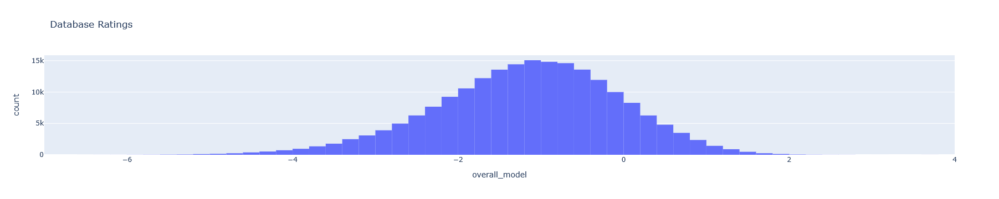

In [19]:
if run_mode=='Populate Playlist':
  fig = px.histogram(df_old_rating, x='overall_model',nbins=100, title='Database Ratings')
  fig.show()

In [20]:
if run_mode=='Populate Playlist':
  # Filter out listened songs from rec database
  save_dir = os.path.join(SAVE_DIR, 'song_listened.csv')
  if os.path.exists(save_dir):
    df_old_listened = pd.read_csv(save_dir)
    df_old_listened.rename(columns={'Unnamed: 0': 'song_id'}, inplace=True)
    df_old_listened.set_index('song_id', inplace=True)
    display(df_old_listened)

    if flt_listened_songs:
      df_old_rating= df_old_rating[~df_old_rating.index.isin(df_old_listened.index.tolist())]

,rating,overall_model
song_id,,
3zKugWccmjRYXmfTk2Uhdz,7.069641,NaN
411rcI6KFOx1BYw8HY4shd,6.861018,NaN
0Vfyd4UVabI6DQFkfSsXDZ,6.481030,NaN
5RPFcT0AUII13XEHjUAWpN,6.274781,NaN
5ixZtKReudknEjyzSAt6vy,6.258977,NaN
...,...,...
7DjX3cQD1ICl5INPrVqEXY,NaN,0.762502
6no6pPfAnx5MX1l6ZDCTQt,NaN,0.762465
64ztV3lty4fzvVry8Xy6zr,NaN,0.762452


In [21]:
if run_mode=='Populate Playlist':
  if rated_song_sel_method=='threshold':
    df_recs = df_old_rating[df_old_rating['overall_model']>=threshold_sel]
    out_songs = df_recs.index.tolist()
    print(f'Songs to be added: {len(out_songs)}')
  elif rated_song_sel_method=='number':
    df_recs = df_old_rating.sort_values(by='overall_model', ascending=False).head(number_sel)
    out_songs = df_recs.index.tolist()
    print(f'Songs to be added: {len(out_songs)}')
  elif rated_song_sel_method=='percentile':
    threshold = np.percentile(list(df_old_rating.overall_model), percentile_sel)
    out_songs = list(df_old_rating[df_old_rating.overall_model >= threshold].index)
    print(f'Songs to be added: {len(out_songs)}')

Songs to be added: 500


In [22]:
if run_mode=='Populate Playlist':
  df_listened = df_old_rating.loc[out_songs]

  # Update Listened Songs
  if os.path.exists(save_dir):
    df_listened = pd.concat(objs=[df_old_listened, df_listened], axis=0)
  save_dir = os.path.join(SAVE_DIR, 'song_listened.csv')
  df_listened.to_csv(save_dir)
  print('Rating Database Updated!')

Rating Database Updated!


In [23]:
# Upload Songs
if run_mode=='Populate Playlist':
  upload_songs(out_songs, playlist_uri=output_playlist_sel, replace_pl_songs=replace_output_playlist_songs)
  print("Playlist Updated Successfully!")
  print(f"{len(out_songs)} songs were added to the playlist")

Playlist Updated Successfully!
500 songs were added to the playlist


# Find Top Rated Songs in Database

In [ ]:
num_songs=50

save_dir = os.path.join(SAVE_DIR, 'song_recs_rated.csv')
df_old_rating = pd.read_csv(save_dir)
df_old_rating.rename(columns={'Unnamed: 0': 'song_id'}, inplace=True)
df_old_rating.sort_values('overall_model', ascending=False, inplace=True)
top_songs = df_old_rating.head(num_songs)
top_songs

In [ ]:
song_ids=top_songs['song_id'].values.tolist()
chunked_data = chunks(song_ids, 50)
out = []
for chunk in chunked_data:
    results = sp.tracks(chunk)
    out.extend(results['tracks'])

In [ ]:
artist, ref, name = [], [], []
for track in out:
    artist.append(track['artists'][0]['name'])
    ref.append(track['external_urls']['spotify'])
    name.append(track['name'])
df_top_out = pd.DataFrame(list(zip(top_songs['song_id'], name, artist, ref, top_songs['overall_model'])), columns=['song_id', 'song_name', 'artist', 'link', 'rating'])
df_top_out

In [ ]:
upload_songs(top_songs['song_id'].values.tolist(), playlist_uri='spotify:playlist:0Jf3yQ2pWA7XBjbXXDoM9n', replace_pl_songs=replace_output_playlist_songs)

In [ ]:
px.histogram(df_old_rating, x='overall_model')

# Get Latest Songs

In [ ]:
#@title Pick New Song Filter Date { run: "auto" }
from datetime import datetime
before_filter_date = "2024-11-21" #@param {type:"date"}
after_filter_date = "2022-10-31" #@param {type:"date"}
n_artists = "first" #@param ["first", "all"]
before_filter_date = datetime.strptime(before_filter_date, '%Y-%m-%d').date()
after_filter_date = datetime.strptime(after_filter_date, '%Y-%m-%d').date()

In [ ]:
# Create favorite song ids
basic_dataset_path = os.path.join(DATA_DIR, 'Databases','Basic_Dataset')
fav_song_ids = []
for dataset in os.listdir(basic_dataset_path):
    df_basic = pd.read_csv(os.path.join(basic_dataset_path, dataset))
    fav_song_ids.extend(df_basic[df_basic['rating']==df_basic['rating'].max()]['song_id'].tolist())
df_fav = pd.DataFrame(data=zip(fav_song_ids, [5]*len(fav_song_ids)), columns=['song_id','rating'])
# Get artists
df_fav_artist = create_song_df(df_fav)
if n_artists=='first':
    artist_list = set([item[0] for item in df_fav_artist.artist_id])
else:
    flat_list = [item for sublist in list(df_fav_artist.artist_id) for item in sublist]
    artist_list = set(flat_list)
# Get album data for filtering
artist_alb_dict = {'album_id': [], 'album_date': []}
for artist in artist_list:
  albums = sp.artist_albums(artist)
  for album in albums['items']:
    album_id = album['id']
    try:    # Date may only give year
      album_date = datetime.strptime(album['release_date'], '%Y-%m-%d').date()
    except:
      album_date = datetime.strptime(album['release_date'] + '-01-01', '%Y-%m-%d').date()  
    artist_alb_dict['album_id'].append(album_id)
    artist_alb_dict['album_date'].append(album_date)
df_album = pd.DataFrame(artist_alb_dict)
# Filter songs
df_album_sorted = df_album[(df_album['album_date'] > after_filter_date) & (df_album['album_date'] < before_filter_date)]
albums = list(df_album_sorted.album_id)
out_song_list, song_names, song_artist, artist_1, artist_2, artist_3 = [], [], [], [], [], []
for album in albums:
  album_tracks = sp.album_tracks(album)
  for track in album_tracks['items']:
    out_song_list.append(track['id'])
    song_names.append(track['name'])
    artists = [artist['name'] for artist in track['artists']]
    artist_1.append(artists[0])
    if len(artists) > 1:
        artist_2.append(artists[1])
    else:
        artist_2.append(np.nan)
    if len(artists) > 2:
        artist_3.append(artists[2])
    else:
        artist_3.append(np.nan)
df_new_songs = pd.DataFrame(data=zip(out_song_list, song_names, artist_1, artist_2, artist_3),
                            columns=['id','song_name','artist_1','artist_2','artist_3'])
df_new_songs['dup_col']=df_new_songs.duplicated(subset=['song_name','artist_1','artist_2','artist_3'], keep='first')
df_flt = df_new_songs[df_new_songs['dup_col']==False]
out_song_list = df_flt['id'].tolist()
# Upload
upload_songs(out_song_list, playlist_uri=output_playlist_sel, replace_pl_songs=replace_output_playlist_songs)
print("Playlist Updated Successfully!")
print(f"{len(out_song_list)} songs were added to the playlist")